# HuggingFace Pusher

In this file, the annotations are consolidated and pushed to HuggingFace dataset

## Imports

Loading necessary imports for this notebook

In [ ]:
import json
import os
import random
from IPython.display import display
from datasets import Dataset, Image
from plantuml_server import plantuml_to_xmi

## Code

Load the annotations

In [20]:
with open("annotations.json", "r") as f:
    data = json.load(f)

Output the number of annotated images

In [21]:
print(len(data))

564


Preprocess data by replacing the slash in image paths

In [22]:
for item in data:
    item['image'] = item['image'].replace("\\", "/")
    print(item)

{'image': 'images/handwritten_uml_class_diagrams_kaggle/1.jpg', 'plantuml': '```plantuml\n@startuml\n\nskinparam groupInheritance 2\n\nclass Order {\n   date\n   prepaid\n   number\n   price\n}\n\nClass OrderLine {\n  Product\n  Price\n  Quantity\n}\n\nclass Customer {\n  name\n  address\n  ratings\n}\n\nclass Corporate extends Customer {\n  name\n  rating\n  limit\n}\n\nclass Personal extends Customer {\n  id\n  contact\n}\n\nOrder "1" -- "*" OrderLine\n\nOrder "n" -- "1" Customer\n\n\n@enduml\n```', 'timestamp': '2025-12-19T13:15:43.604569', 'type': 'class_diagram'}
{'image': 'images/handwritten_uml_class_diagrams_kaggle/10.jpg', 'plantuml': '```plantuml\n@startuml\n\nskinparam groupInheritance 2\n\nclass Member\nclass Lecturer extends Member\nclass Student extends Member\n\n@enduml\n```', 'timestamp': '2025-12-19T13:18:30.302791', 'type': 'class_diagram'}
{'image': 'images/handwritten_uml_class_diagrams_kaggle/11.jpg', 'plantuml': '```plantuml\n@startuml\n\nskinparam groupInheritanc

List all images recursively

In [23]:
import os

images = []

for root, dirs, files in os.walk("images/"):
    for file in files:
        images.append(os.path.join(root, file).replace("\\", "/"))
        print(os.path.join(root, file).replace("\\", "/"))

images/activitiy_diagram_extra.pdf
images/activity_diagrams_handwritten_synthetic_scanned1.pdf
images/activity_diagrams_handwritten_synthetic_scanned3.pdf
images/class_diagram_extra.pdf
images/Notes_260223_224209.pdf
images/activity_diagrams_handwritten_scanned/2026-03-06_150201 (35).jpg
images/activity_diagrams_handwritten_scanned/activity_diagrams_handwritten_scanned1 (40).jpg
images/activity_diagrams_handwritten_scanned/activity_diagrams_handwritten_scanned2 (12).jpg
images/activity_diagrams_handwritten_scanned/Handschriftlicher Text_2026-03-06_143243.jpg
images/activity_diagrams_handwritten_scanned/Handschriftlicher Text_2026-03-06_143335 (2).jpg
images/activity_diagrams_handwritten_scanned/Handschriftlicher Text_2026-03-06_143405 (3).jpg
images/activity_diagrams_handwritten_scanned/Handschriftlicher Text_2026-03-06_143442 (4).jpg
images/activity_diagrams_handwritten_scanned/Handschriftlicher Text_2026-03-06_143521 (5).jpg
images/activity_diagrams_handwritten_scanned/Handschriftlic

Check if all images have annotations

In [24]:
annotated_images = {item['image'] for item in data}
for img in images:
    if img.endswith('.pdf'):
        continue
    if img not in annotated_images:
        print(f"Missing annotation for image: {img}")

## Prepare for HuggingFace

In [25]:
converted_data = []
validation_stats = {"xmi_success": 0, "xmi_failed": 0, "skipped_activity": 0, "total": len(data)}
    
for idx, item in enumerate(data):
    print(f"Processing {idx+1}/{len(data)}: {item['image']}")
    
    # Activity diagrams don't generate XMI - include them directly
    if item['type'] == 'activity_diagram':
        validation_stats["skipped_activity"] += 1
        entry = {
            "image": item['image'],
            "type": item['type'],
            "code": item['plantuml'],
            "xmi": None
        }
        converted_data.append(entry)
        print(f"  ↷ Activity diagram - skipping XMI generation")
        continue

    # Try to generate XMI
    xmi_output = plantuml_to_xmi(item['plantuml'])
    
    if xmi_output:
        validation_stats["xmi_success"] += 1
        
        # Create simple columnar format entry (only if XMI generation succeeded)
        entry = {
            "image": item['image'],
            "type": item['type'],
            "code": item['plantuml'],
            "xmi": xmi_output
        }
        
        converted_data.append(entry)
        print(f"  ✓ XMI generated successfully")
    else:
        validation_stats["xmi_failed"] += 1
        print(f"  ✗ XMI generation failed - skipping (likely uses association class syntax)")

print(f"\n{'='*60}")
print("Validation Summary:")
print(f"{'='*60}")
print(f"Total annotations: {validation_stats['total']}")
print(f"XMI generated successfully: {validation_stats['xmi_success']}")
print(f"XMI generation failed (skipped): {validation_stats['xmi_failed']}")
print(f"Activity diagrams (no XMI): {validation_stats['skipped_activity']}")
print(f"Rows in dataset: {len(converted_data)}")

Processing 1/564: images/handwritten_uml_class_diagrams_kaggle/1.jpg
  ✓ XMI generated successfully
Processing 2/564: images/handwritten_uml_class_diagrams_kaggle/10.jpg
  ✓ XMI generated successfully
Processing 3/564: images/handwritten_uml_class_diagrams_kaggle/11.jpg
  ✓ XMI generated successfully
Processing 4/564: images/handwritten_uml_class_diagrams_kaggle/12.jpg
  ✓ XMI generated successfully
Processing 5/564: images/handwritten_uml_class_diagrams_kaggle/13.jpg
  ✓ XMI generated successfully
Processing 6/564: images/handwritten_uml_class_diagrams_kaggle/14.jpg
  ✓ XMI generated successfully
Processing 7/564: images/handwritten_uml_class_diagrams_kaggle/15.jpg
  ✓ XMI generated successfully
Processing 8/564: images/handwritten_uml_class_diagrams_kaggle/16.jpg
  ✓ XMI generated successfully
Processing 9/564: images/handwritten_uml_class_diagrams_kaggle/17.jpg
  ✓ XMI generated successfully
Processing 10/564: images/handwritten_uml_class_diagrams_kaggle/18.jpg
  ✓ XMI generated suc

In [26]:
converted_data

[{'image': 'images/handwritten_uml_class_diagrams_kaggle/1.jpg',
  'type': 'class_diagram',
  'code': '```plantuml\n@startuml\n\nskinparam groupInheritance 2\n\nclass Order {\n   date\n   prepaid\n   number\n   price\n}\n\nClass OrderLine {\n  Product\n  Price\n  Quantity\n}\n\nclass Customer {\n  name\n  address\n  ratings\n}\n\nclass Corporate extends Customer {\n  name\n  rating\n  limit\n}\n\nclass Personal extends Customer {\n  id\n  contact\n}\n\nOrder "1" -- "*" OrderLine\n\nOrder "n" -- "1" Customer\n\n\n@enduml\n```',
  'xmi': '<?xml version="1.0" encoding="UTF-8"?><XMI xmlns:UML="href://org.omg/UML/1.3" xmi.version="1.1">\r\n    <XMI.header>\r\n        <XMI.documentation>\r\n            <XMI.exporter>PlantUML</XMI.exporter>\r\n            <XMI.exporterVersion>1.2026.1</XMI.exporterVersion>\r\n        </XMI.documentation>\r\n        <XMI.metamodel xmi.name="UML" xmi.version="1.4"/>\r\n    </XMI.header>\r\n    <XMI.content>\r\n        <UML:Model name="PlantUML" xmi.id="model1">

## Resize Image

In [27]:
from PIL import Image as PILImage

def resize_image_preserve_aspect(image_path, max_size=1000):
    """
    Resize image while preserving aspect ratio.
    Max dimension (width or height) will be max_size pixels.
    """
    img = PILImage.open(image_path)
    
    # Get current dimensions
    width, height = img.size
    
    # Calculate scaling factor
    scale = min(max_size / width, max_size / height)
    
    # Only resize if image is larger than max_size
    if scale < 1.0:
        new_width = int(width * scale)
        new_height = int(height * scale)
        img = img.resize((new_width, new_height), PILImage.LANCZOS)
        print(f"  Resized: {width}x{height} → {new_width}x{new_height}")
    else:
        print(f"  Kept original size: {width}x{height}")
    
    return img

# Resize images before creating dataset
print(f"\n{'='*60}")
print("Resizing images...")
print(f"{'='*60}")

for idx, item in enumerate(converted_data):
    print(f"Processing image {idx+1}/{len(converted_data)}: {item['image']}")
    # Replace path with actual resized PIL Image
    item['image'] = resize_image_preserve_aspect(item['image'], max_size=1000)

print(f"\n{'='*60}")
print("Creating dataset...")
print(f"{'='*60}")


Resizing images...
Processing image 1/557: images/handwritten_uml_class_diagrams_kaggle/1.jpg
  Resized: 2129x1834 → 1000x861
Processing image 2/557: images/handwritten_uml_class_diagrams_kaggle/10.jpg
  Resized: 1871x1036 → 999x553
Processing image 3/557: images/handwritten_uml_class_diagrams_kaggle/11.jpg
  Resized: 2094x1287 → 1000x614
Processing image 4/557: images/handwritten_uml_class_diagrams_kaggle/12.jpg
  Resized: 2484x1900 → 1000x764
Processing image 5/557: images/handwritten_uml_class_diagrams_kaggle/13.jpg
  Resized: 894x1362 → 656x1000
Processing image 6/557: images/handwritten_uml_class_diagrams_kaggle/14.jpg
  Resized: 943x1074 → 878x1000
Processing image 7/557: images/handwritten_uml_class_diagrams_kaggle/15.jpg
  Resized: 2312x1158 → 1000x500
Processing image 8/557: images/handwritten_uml_class_diagrams_kaggle/16.jpg
  Resized: 2487x1469 → 1000x590
Processing image 9/557: images/handwritten_uml_class_diagrams_kaggle/17.jpg
  Resized: 1240x1045 → 999x842
Processing im

## Make Train/Test Split

Allocate 15 images of class diagrams and 15 images of activity diagrams to test split carefully such that they are meaningful for the testing during training.

In [93]:
# Get class diagram indices
class_indices = [i for i, item in enumerate(converted_data) if item['type'] == 'class_diagram']

# Get activity diagram indices
activity_indices = [i for i, item in enumerate(converted_data) if item['type'] == 'activity_diagram']

# Choose a seed such that the split is meaningful
random.seed(91)
test_class_indices = set(random.sample(class_indices, 15))

# Choose a seed such that the split is meaningful
random.seed(9)
test_activity_indices = set(random.sample(activity_indices, 15))

test_indices = test_class_indices | test_activity_indices

train_data = [item for i, item in enumerate(converted_data) if i not in test_indices]
test_data = [item for i, item in enumerate(converted_data) if i in test_indices]


In [94]:
print(f"Train: {len(train_data)}, Test: {len(test_data)}")

Train: 527, Test: 30



Test class diagrams (15):


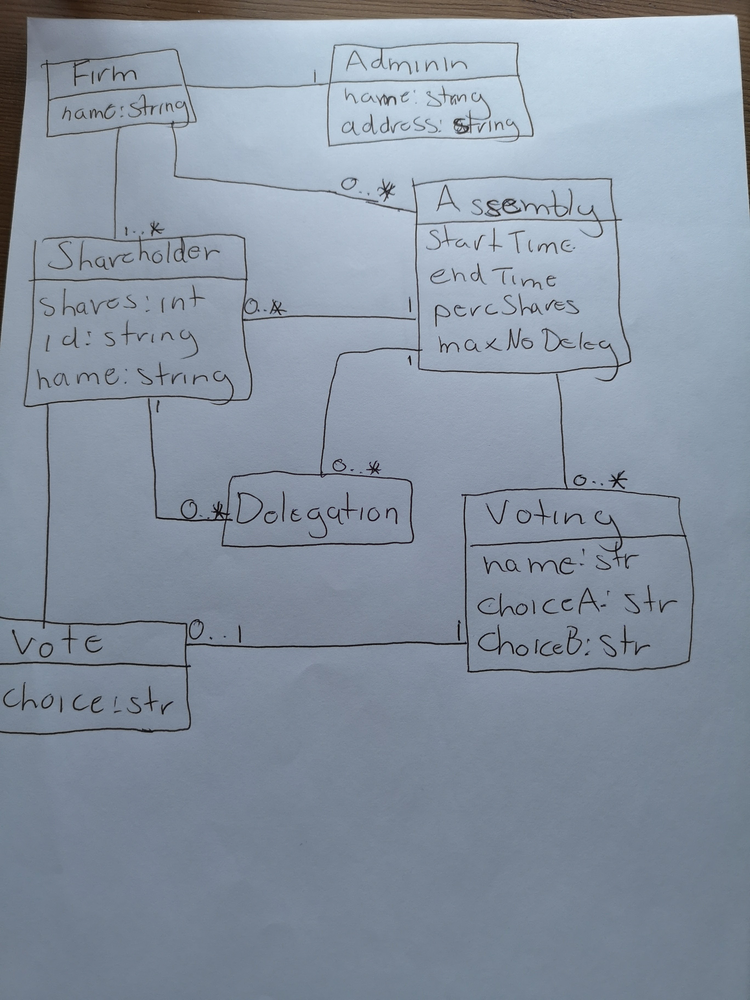

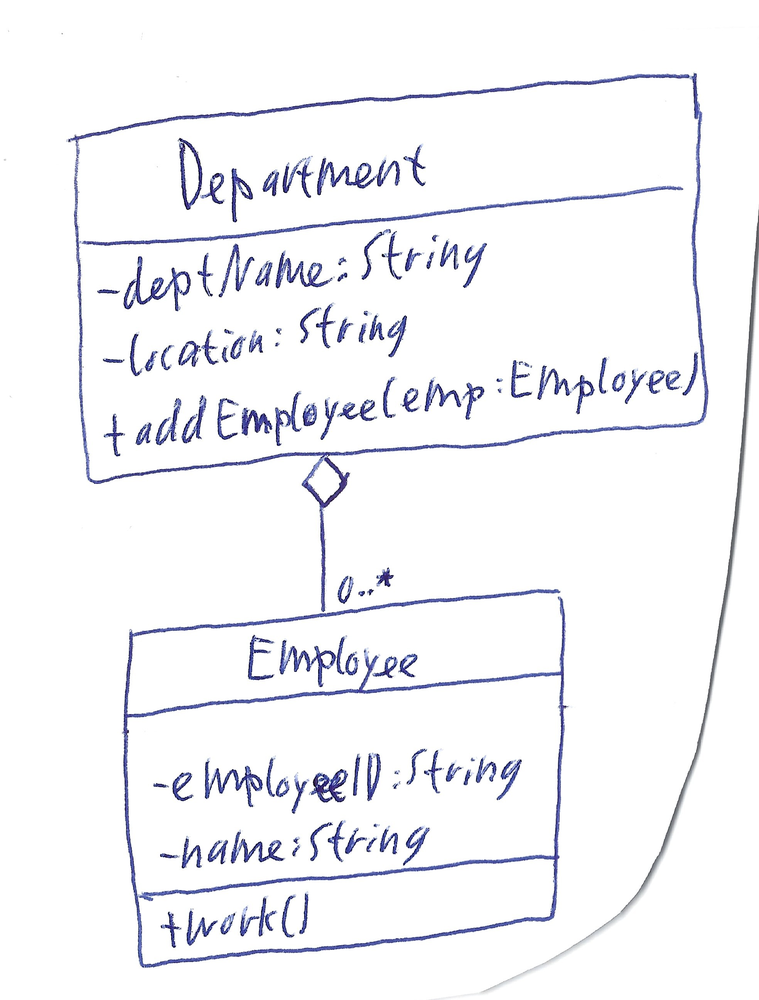

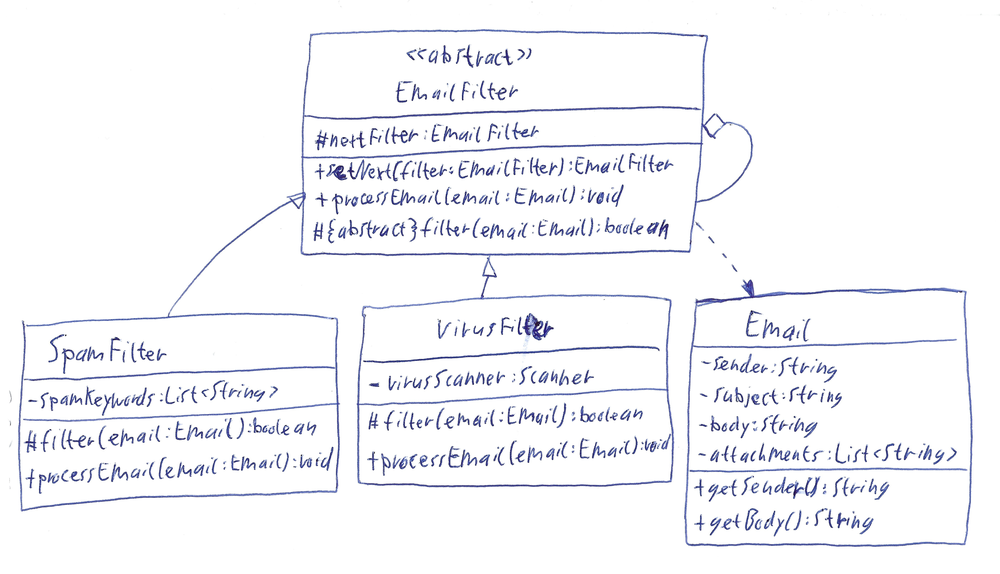

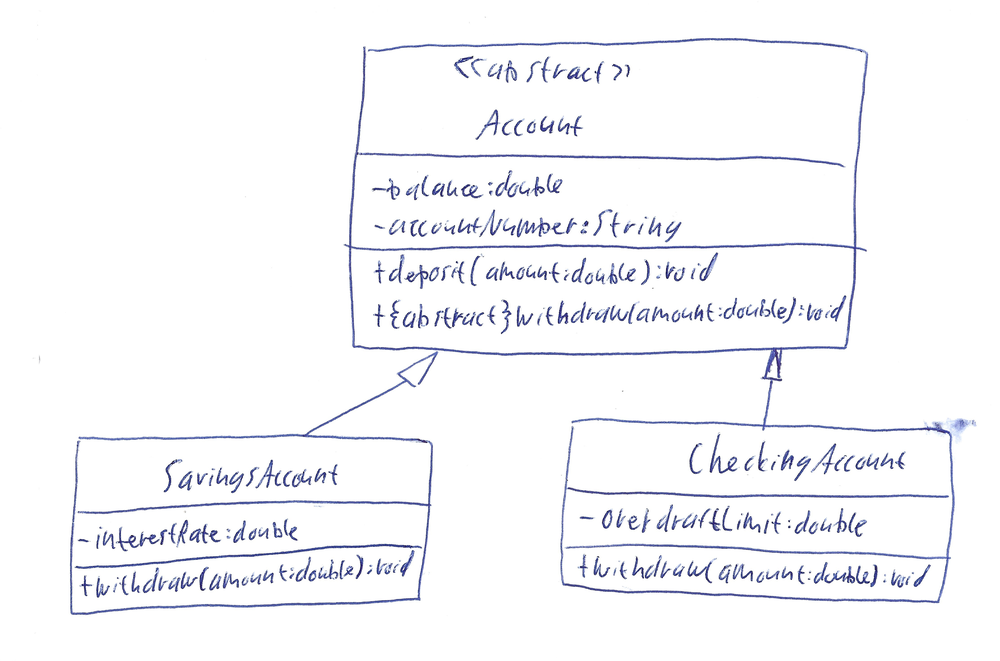

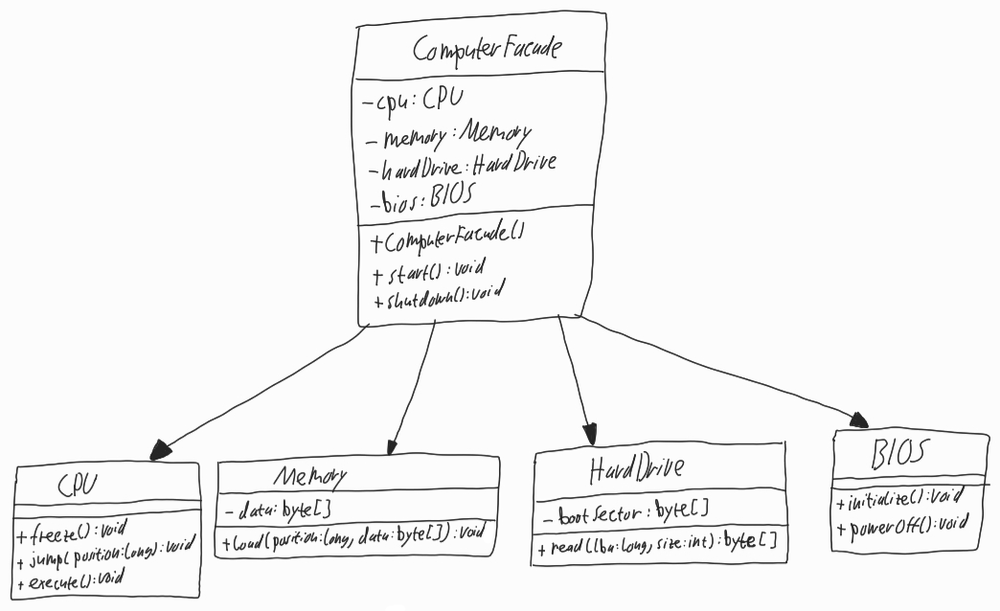

...

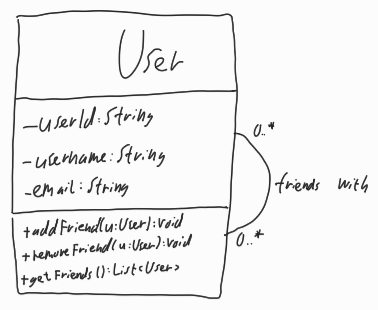

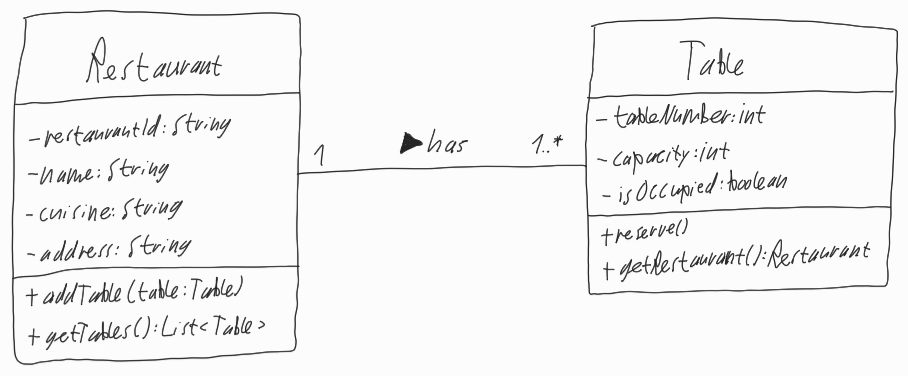

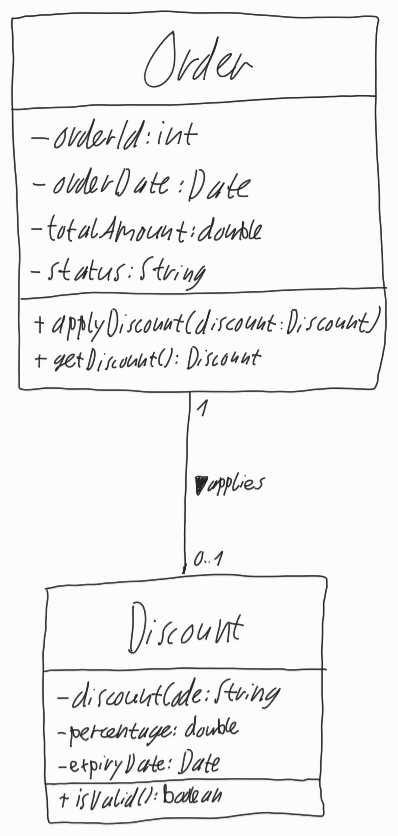

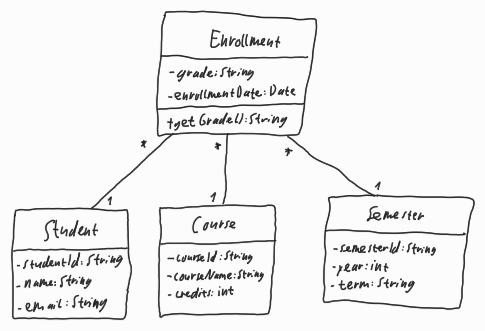

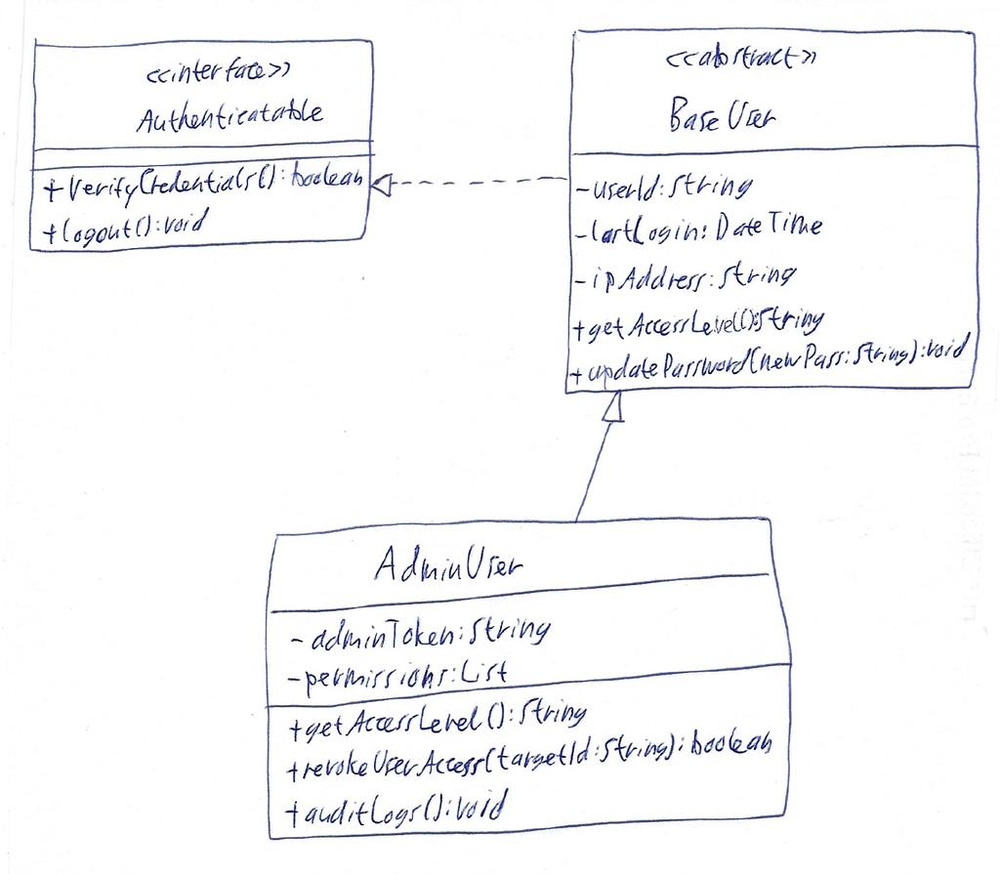

In [95]:
print(f"\nTest class diagrams (15):")
for i in sorted(test_class_indices):
    display(converted_data[i]['image'])


Test activity diagrams (15):


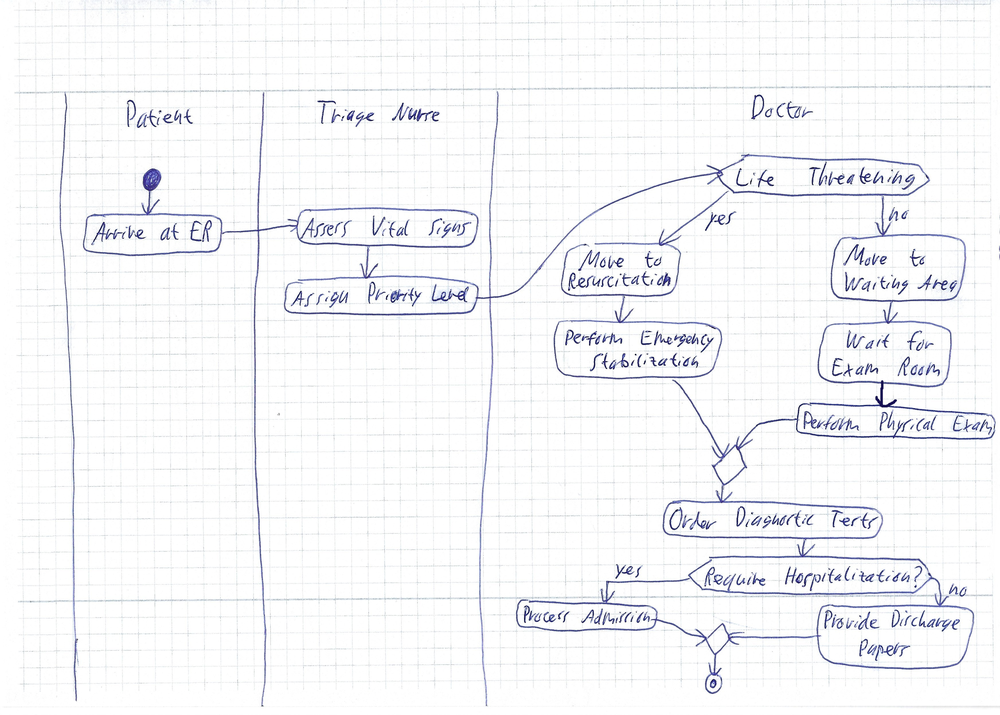

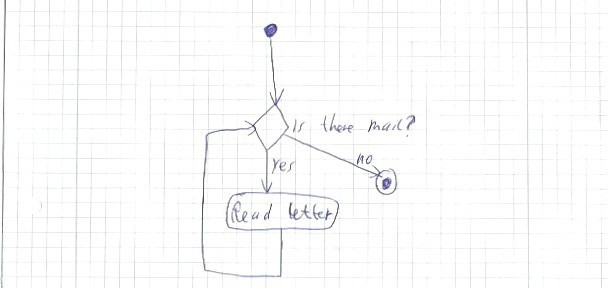

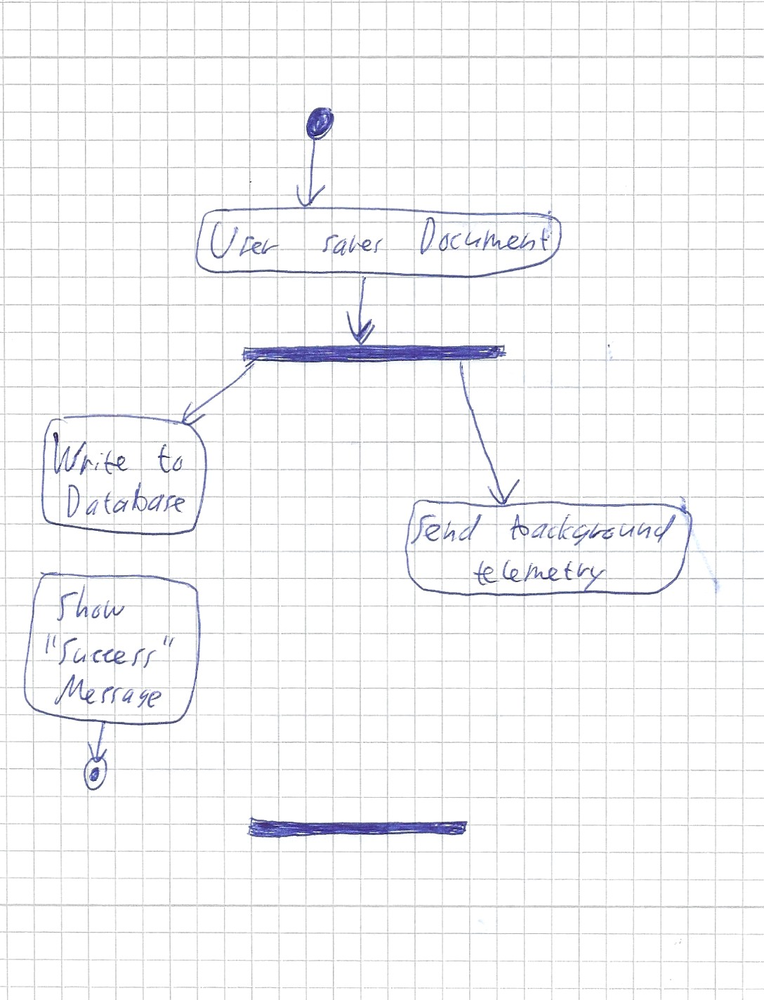

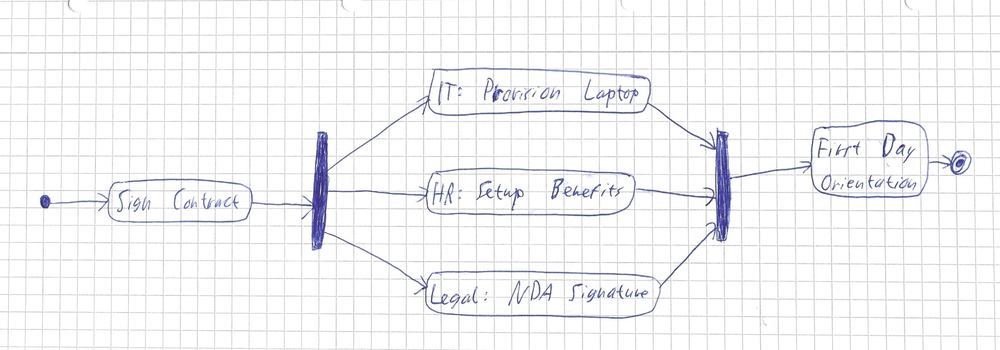

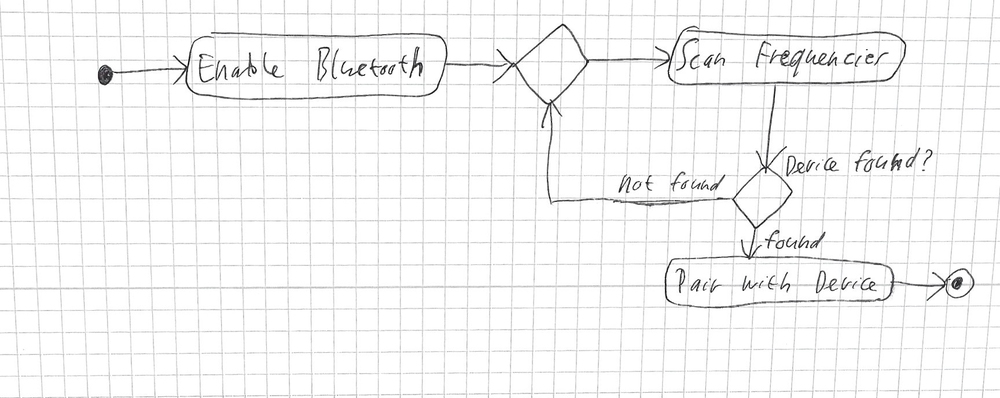

...

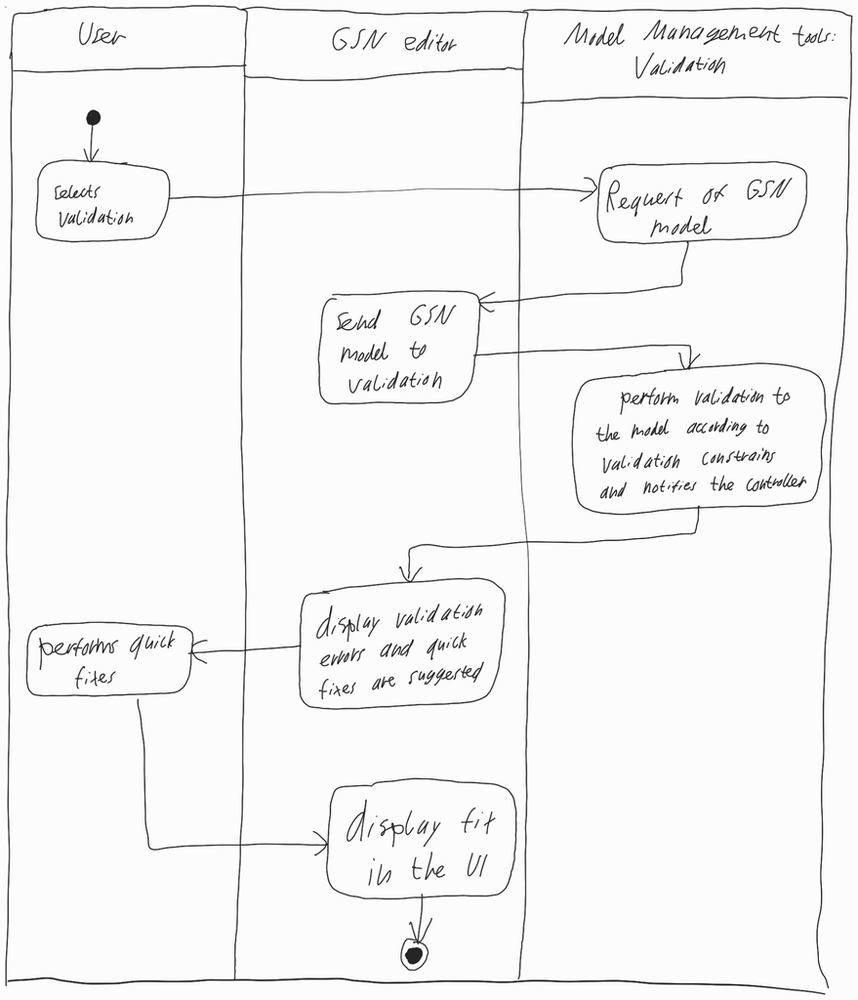

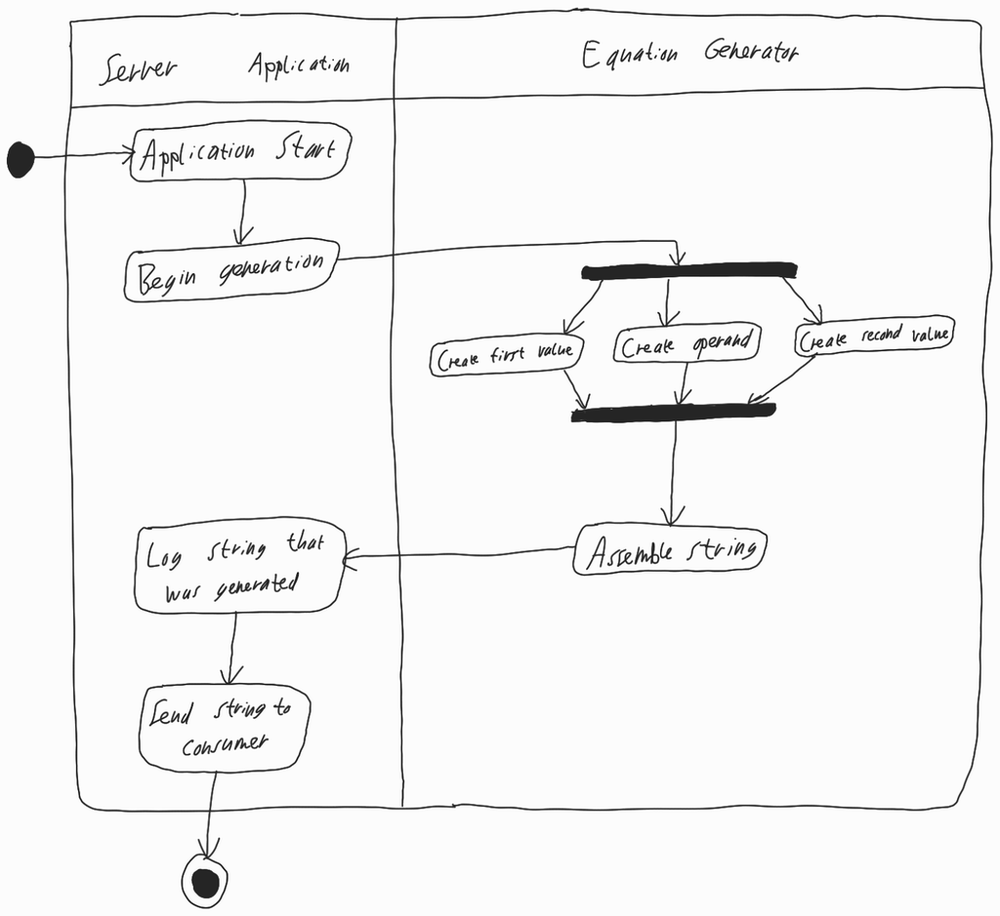

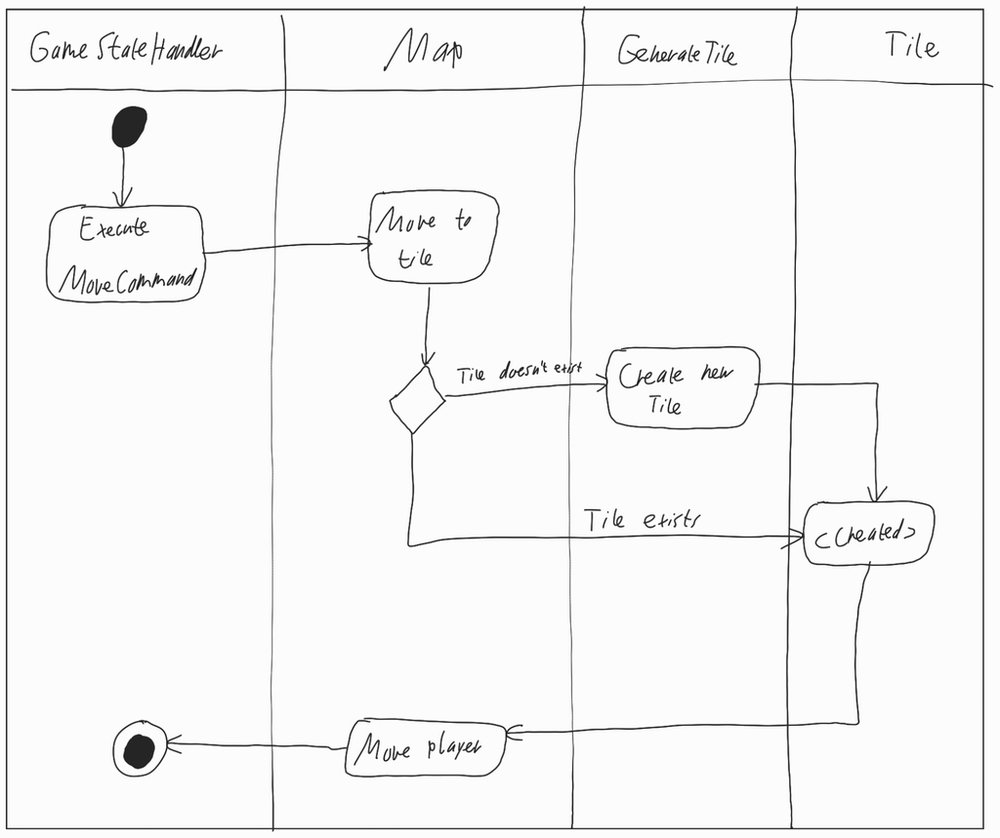

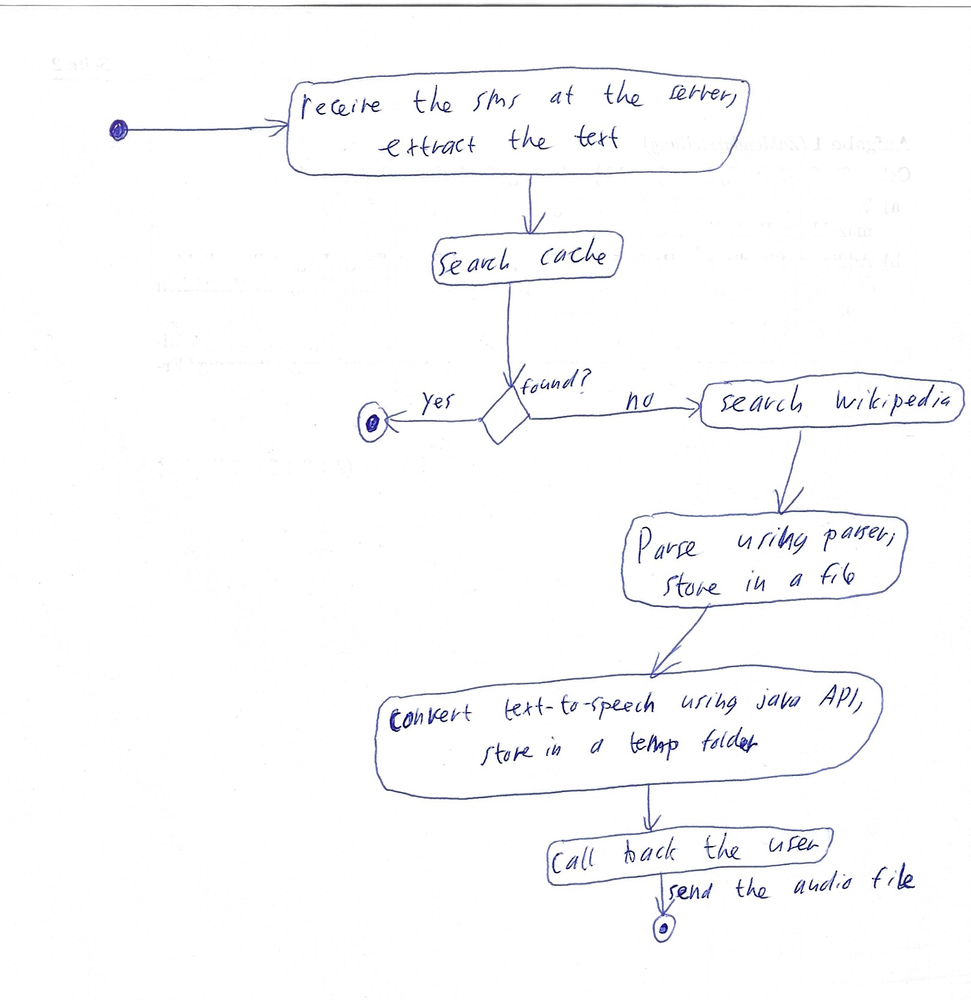

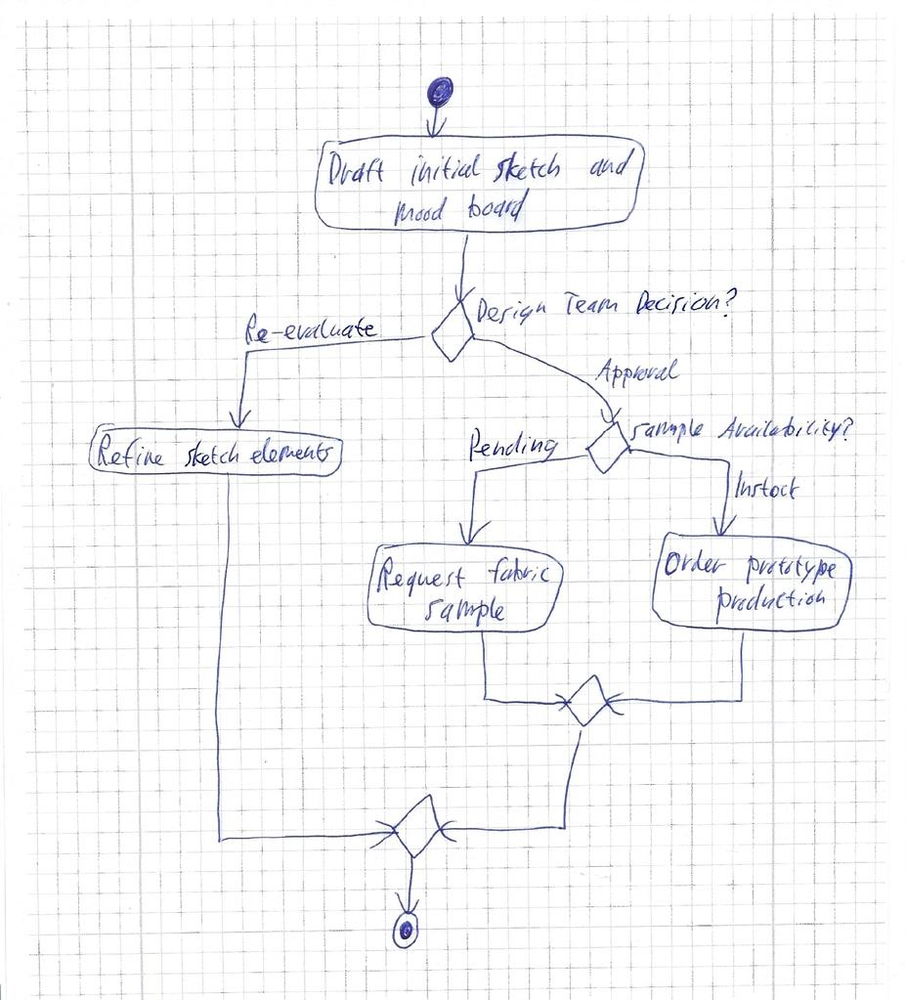

In [54]:
print(f"\nTest activity diagrams (15):")
for i in sorted(test_activity_indices):
    display(converted_data[i]['image'])

## Push to HuggingFace Datasets

In [ ]:
# from datasets import DatasetDict

# train_dataset = Dataset.from_list(train_data).cast_column('image', Image())
# test_dataset = Dataset.from_list(test_data).cast_column('image', Image())

# dataset = DatasetDict({"train": train_dataset, "test": test_dataset})
#dataset.push_to_hub("Seym0n/handwritten_plantuml_dataset")